In [1]:
import pandas as pd
import time
import tweepy


In [ ]:
#get token form config file
token = pd.read_csv('config.csv')['token'][0]
client = tweepy.Client(bearer_token=token)

In [ ]:
def fetch_tweets(hashtag, count=10, retries=3):

    query = f"#{hashtag} -is:retweet lang:en"
    for attempt in range(retries):
        try:
            tweets = client.search_recent_tweets(query=query, max_results=count, tweet_fields=['text'])
            tweet_list = [tweet.text for tweet in tweets.data]
            return tweet_list
        except tweepy.errors.TooManyRequests:
            if attempt < retries - 1:
                time.sleep(2 * 60)  # Wait for 15 minutes
            else:
                raise

# Example usage
tweets = fetch_tweets("covid", 100)
tweets

['#COVID #vaccine-related death estimates suggest millions could have died from the shots\nhttps://t.co/EbhWzPDj76',
 '@cityoflondon @lordmayors_show SCUM BURN INN #HELL I GOT A #MATCH OR #TWO @sinnfeinireland @SinnFeinShop #TARAHILL FUCK YOUR #TARAgrassCORPS #KINCORA #CONART IST  BOILS ZITS Pure #BuddhaPoison You spiritual babies in diapers #CLUELESS BY DEFFINITION WHAT WAS #COVID #ALLAH BOUT FLU ON STERIODS OR DRUGS #PMSL… https://t.co/ibTDPLjC50 https://t.co/i5dMCR5VjJ',
 'Bastards, take away my fans and keep me with you bastards\n#Covid #Covidlovers #Youtube',
 "Thank you #COVIDLOVERS for always being there, you are my daily motivation to get up with the best energy, without you I can't get up, nor move forward 💖🌈\n#Covid #Fans #Youtube \nhttps://t.co/75Q64S66ux",
 '@_wake_up_USA The guy... who literally owns the #Patent on the #CoViD #BioWeapon... the guy who literally funded the development of that BioWeapon... The Guy who is on a video no one contests describing exactly how that

In [3]:
df = pd.read_csv("covid19_tweets.csv")
df.head(100)

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet
0,ᏉᎥ☻լꂅϮ,astroworld,wednesday addams as a disney princess keepin i...,2017-05-26 05:46:42,624,950,18775,False,2020-07-25 12:27:21,If I smelled the scent of hand sanitizers toda...,NaN,Twitter for iPhone,False
1,Tom Basile 🇺🇸,"New York, NY","Husband, Father, Columnist & Commentator. Auth...",2009-04-16 20:06:23,2253,1677,24,True,2020-07-25 12:27:17,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,NaN,Twitter for Android,False
2,Time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9275,9525,7254,False,2020-07-25 12:27:14,@diane3443 @wdunlap @realDonaldTrump Trump nev...,['COVID19'],Twitter for Android,False
3,ethel mertz,Stuck in the Middle,#Browns #Indians #ClevelandProud #[]_[] #Cavs ...,2019-03-07 01:45:06,197,987,1488,False,2020-07-25 12:27:10,@brookbanktv The one gift #COVID19 has give me...,['COVID19'],Twitter for iPhone,False
4,DIPR-J&K,Jammu and Kashmir,🖊️Official Twitter handle of Department of Inf...,2017-02-12 06:45:15,101009,168,101,False,2020-07-25 12:27:08,25 July : Media Bulletin on Novel #CoronaVirus...,"['CoronaVirusUpdates', 'COVID19']",Twitter for Android,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,Safiy,NaN,"Detroit life. Creative Beast, Animation, Visua...",2019-11-18 16:27:39,9,33,42,False,2020-07-25 12:24:20,Shout out to Earth. Hands down the worst react...,NaN,Twitter for iPhone,False
96,TNCoronaUpdates,"Chennai, India",Data Analyzer | Stay Connected For All Offici...,2018-04-09 16:00:11,6601,24,22269,False,2020-07-25 12:24:19,#TamilNadu | #COVID19 | 25th July\n\n● TN - ...,"['TamilNadu', 'COVID19']",Twitter for Android,False
97,CraigBrigham MebaneNC #864511320 #GoodTrouble,"Mebane, NC","Fmr Army Security Agency, Meritorious Service....",2019-05-08 14:11:05,77,676,1542,False,2020-07-25 12:24:19,@WLOS_13 @wcti12 @thecw22 @myrdc @ABC45TV Plea...,NaN,Twitter for Android,False
98,The GAA,Ireland,Gaelic Athletic Association/Cumann Lúthchleas ...,2009-11-13 13:40:15,398260,150,2864,True,2020-07-25 12:24:17,You can all #PlayYourPart in the fight against...,"['PlayYourPart', 'Covid19', 'InThisTogether']",Twitter for iPhone,False


In [4]:
#remove rows with missing values
df = df.dropna()
len(df)

99138

In [34]:
#check for hastags which have the hashtag vaccine, anti vaccine, covid vaccine
df_hash = df['hashtags']
tags = set()
count = 0
anti =0 
for row in iter(df_hash):
    #convert str to list
    
    row = row[1:-1].split(", ")
    for tag in row:
        tag = tag.replace("'", "").strip()
        tag = tag.lower()
        tags.add(tag)
    if tag == "vaccine" or tag == "anti-vaccine" or tag == "covid vaccine":
        count += 1
    if tag == "antivax":
        anti += 1

print(len(tags))

30974


In [33]:
c =0 
#write tag to a file
tags = []
for idx,row in df.iterrows():
    hashs = row['hashtags']
    hashs = hashs[1:-1].split(", ")
    for tag in hashs:
        tags.append(tag)
        if tag.startswith("antivaxx"):
            c += 1
with open("tags.txt", "w") as f:
    for tag in tags:
        f.write(tag)
        f.write("\n")
        if tag.startswith("antivax"):
            c += 1

In [7]:
tags = list(tags)
for tag in tags:
    #convert to lowercase
    tag = tag.lower()
    print(tag)




birth
ahmedabad
dynamitevideoteaser
feelingit
sleepinginsweat
guijarat
buildabetterke
priorities
saturdaysmiles
testing
faucifirstpitch
kritisanon
baidu
feministaf
rtept
scriptednation113
phoebesfarm
sen
centralgovernment
signage
vintagelens
gst
donateblood
canlaw
lockdownday133
liverdisease
cnashwathnarayan
middleeast
stevenmiller
korea_asean
pms
workers
covidspotlight
ledscreen
iamlost
odisha
opengovernment
episode7
knowrealallah_thismuharram
uselubenexttime
monsoon
londonaffairs
hindu
tobacco
lakeside
harveycedars
jobcrisis
commuterbhaina
sanrio
cheetoinchief
gls2020
russianright
sold
chinaliedandpeopledied
coronaviruskenya
uranus
caringbah
chinaliespeopledie
carnivalcruise
6000strong
duplincounty
the961
greencleaning
blink
normalizecannabis
jk
sakebarkushi
subash
samatv
homeworkout
sierraleone
tmnt
mgh
ruralindia
metoo
elbowbump
papua
howtodoitright
146000dead
lungs
340b
thermalcamera
camaro
reebok
proudlyafrican
badbustrips
zachsmath
aliens
nrityagopaldas
spx500
djibouti
internet


In [8]:
#get user mentions from the data tweet
#there is no column for user mentions
#we can extract user mentions from the tweet text
#create a column for user mentions

df_text = df['text']
mentions = set()
for row in iter(df_text):
    row = row.split()
    for word in row:
        if word[0] == "@":
            mentions.add(word[1:])


In [9]:
def extract_user_mentions(text):
    words = text.split()
    mentions = [word[1:] for word in words if word[0] == "@" and len(word) > 1]
    return mentions

In [10]:
df['user_mentions'] = df['text'].apply(extract_user_mentions)
df

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet,user_mentions
2,Time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9275,9525,7254,False,2020-07-25 12:27:14,@diane3443 @wdunlap @realDonaldTrump Trump nev...,['COVID19'],Twitter for Android,False,"[diane3443, wdunlap, realDonaldTrump]"
3,ethel mertz,Stuck in the Middle,#Browns #Indians #ClevelandProud #[]_[] #Cavs ...,2019-03-07 01:45:06,197,987,1488,False,2020-07-25 12:27:10,@brookbanktv The one gift #COVID19 has give me...,['COVID19'],Twitter for iPhone,False,[brookbanktv]
4,DIPR-J&K,Jammu and Kashmir,🖊️Official Twitter handle of Department of Inf...,2017-02-12 06:45:15,101009,168,101,False,2020-07-25 12:27:08,25 July : Media Bulletin on Novel #CoronaVirus...,"['CoronaVirusUpdates', 'COVID19']",Twitter for Android,False,"[kansalrohit69, DrSyedSehrish, airnewsalerts, ..."
5,🎹 Franz Schubert,Новоро́ссия,🎼 #Новоро́ссия #Novorossiya #оставайсядома #S...,2018-03-19 16:29:52,1180,1071,1287,False,2020-07-25 12:27:06,#coronavirus #covid19 deaths continue to rise....,"['coronavirus', 'covid19']",Twitter Web App,False,[]
6,hr bartender,"Gainesville, FL",Workplace tips and advice served up in a frien...,2008-08-12 18:19:49,79956,54810,3801,False,2020-07-25 12:27:03,How #COVID19 Will Change Work in General (and ...,"['COVID19', 'Recruiting']",Buffer,False,[ProactiveTalent]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
179101,New Jersey Herald,"Newton, NJ","The New Jersey Herald, a daily newspaper in Ne...",2010-01-07 18:19:37,6274,162,38,False,2020-08-29 19:44:27,Wallkill school nurse adds COVID-19 monitoring...,"['nurses', 'COVID19', 'coronavirus', 'schools']",SocialNewsDesk,False,[]
179102,Pris,T.O.,"A/V/L Techie, camera op. but twitter has becom...",2008-12-31 16:16:12,251,160,627,False,2020-08-29 19:44:23,"we have reached 25mil cases of #covid19, world...",['covid19'],Twitter Web App,False,[]
179103,AJIMATI AbdulRahman O.,"Ilorin, Nigeria",Animal Scientist|| Muslim|| Real Madrid/Chelsea,2013-12-30 18:59:19,412,1609,1062,False,2020-08-29 19:44:21,Thanks @IamOhmai for nominating me for the @WH...,['WearAMask'],Twitter for Android,False,"[IamOhmai, WHO, abdlbaasit_, hvbxxb,…]"
179104,Jason,Ontario,When your cat has more baking soda than Ninja ...,2011-12-21 04:41:30,150,182,7295,False,2020-08-29 19:44:16,2020! The year of insanity! Lol! #COVID19 http...,['COVID19'],Twitter for Android,False,[]


In [11]:
df_mentions = df['user_mentions']   
count =0
for row in iter(df_mentions):
    if len(row) < 1:
        count +=1

count

75408

In [12]:
import string
df_users = df['user_name']
df_mentions = df['user_mentions']
def clean_username(username):
    username = username.lower()
    username = username.translate(str.maketrans('', '', string.punctuation))
    return username

def clear_mentions(mentions):
    mentions = [clean_username(mention) for mention in mentions]
    return mentions

    
    

In [13]:
df['user_name']= df_users.apply(clean_username)
df['user_mentions'] = df_mentions.apply(clear_mentions)

In [14]:
users = df['user_name']
mentions = df['user_mentions']

In [21]:
df_new = pd.DataFrame()
for idx,row in df.iterrows():
    mentions = row['user_mentions']
    #print(type(mentions))
    if len(mentions) > 0:
        for mention in mentions:
            df_new['source'] = df['user_name']
            df_new['target'] = mention
            df_new['hashtags'] = df['hashtags'] 
df_new

KeyboardInterrupt: 

In [62]:
import networkx as nx
import matplotlib.pyplot as plt

# Create a directed graph
G = nx.DiGraph()

# Add edges based on user_name and user_mentions
for index, row in df.iterrows():
    user = row['user_name']
    mentions = row['user_mentions']
    for mention in mentions:
        G.add_edge(user, mention)


In [61]:
def convert_to_words(char_list):
    # Join the characters to form a string
    joined_string = ''.join(char_list)
    # Remove unwanted characters
    cleaned_string = joined_string.replace('[', '').replace(']', '').replace("'", '').replace(",", '')
    # Split by spaces if there are multiple hashtags
    return cleaned_string.split()

df['hashtags'] = df['hashtags'].apply(convert_to_words)

# Convert hashtags to lowercase
df['hashtags'] = df['hashtags'].apply(lambda tags: [tag.lower() for tag in tags])


In [62]:
df

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet,user_mentions
2,time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,0.000381,9525,7254,False,2020-07-25 12:27:14,@diane3443 @wdunlap @realDonaldTrump Trump nev...,[covid19],Twitter for Android,False,"[diane3443, wdunlap, realdonaldtrump]"
3,ethel mertz,Stuck in the Middle,#Browns #Indians #ClevelandProud #[]_[] #Cavs ...,2019-03-07 01:45:06,0.000008,987,1488,False,2020-07-25 12:27:10,@brookbanktv The one gift #COVID19 has give me...,[covid19],Twitter for iPhone,False,[brookbanktv]
4,diprjk,Jammu and Kashmir,🖊️Official Twitter handle of Department of Inf...,2017-02-12 06:45:15,0.004147,168,101,False,2020-07-25 12:27:08,25 July : Media Bulletin on Novel #CoronaVirus...,"[coronavirusupdates, covid19]",Twitter for Android,False,"[kansalrohit69, drsyedsehrish, airnewsalerts, ..."
5,🎹 franz schubert,Новоро́ссия,🎼 #Новоро́ссия #Novorossiya #оставайсядома #S...,2018-03-19 16:29:52,0.000048,1071,1287,False,2020-07-25 12:27:06,#coronavirus #covid19 deaths continue to rise....,"[coronavirus, covid19]",Twitter Web App,False,[]
6,hr bartender,"Gainesville, FL",Workplace tips and advice served up in a frien...,2008-08-12 18:19:49,0.003282,54810,3801,False,2020-07-25 12:27:03,How #COVID19 Will Change Work in General (and ...,"[covid19, recruiting]",Buffer,False,[proactivetalent]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
179101,new jersey herald,"Newton, NJ","The New Jersey Herald, a daily newspaper in Ne...",2010-01-07 18:19:37,0.000258,162,38,False,2020-08-29 19:44:27,Wallkill school nurse adds COVID-19 monitoring...,"[nurses, covid19, coronavirus, schools]",SocialNewsDesk,False,[]
179102,pris,T.O.,"A/V/L Techie, camera op. but twitter has becom...",2008-12-31 16:16:12,0.000010,160,627,False,2020-08-29 19:44:23,"we have reached 25mil cases of #covid19, world...",[covid19],Twitter Web App,False,[]
179103,ajimati abdulrahman o,"Ilorin, Nigeria",Animal Scientist|| Muslim|| Real Madrid/Chelsea,2013-12-30 18:59:19,0.000017,1609,1062,False,2020-08-29 19:44:21,Thanks @IamOhmai for nominating me for the @WH...,[wearamask],Twitter for Android,False,"[iamohmai, who, abdlbaasit, hvbxxb…]"
179104,jason,Ontario,When your cat has more baking soda than Ninja ...,2011-12-21 04:41:30,0.000006,182,7295,False,2020-08-29 19:44:16,2020! The year of insanity! Lol! #COVID19 http...,[covid19],Twitter for Android,False,[]


In [56]:
#get min and max of df['user_followers']
mini = df['user_followers'].min()
maxi = df['user_followers'].max()
#perform min max normalization
df['user_followers'] = (df['user_followers'] - mini) / (maxi - mini)

In [63]:
#nodes -> hastags
#edges -> if hastag ocuur in the same tweet
#edge weight -> follower count of the user
from itertools import combinations
import networkx as nx
G = nx.Graph()

# Iterate through each row in the DataFrame
for _, row in df.iterrows():
    hashtags = row['hashtags']
    #hashtags = hashtags[1:-1].split(", ")
    #hashtags = "".join(hashtags)
    #hastags = hashtags.lower()
    follower_count = row['user_followers']
    if len(hashtags) <= 1:
        continue
    # Add edges for each pair of hashtags
    for hashtag1, hashtag2 in combinations(hashtags, 2):
        if G.has_edge(hashtag1, hashtag2):
            G[hashtag1][hashtag2]['weight'] += follower_count
        else:
            G.add_edge(hashtag1, hashtag2, weight=follower_count)

# Draw the graph


In [64]:
#print(G)
for node, neighbors in G.adjacency():
    print(f"{node}: {[(neighbor, attr['weight']) for neighbor, attr in neighbors.items()]}")


coronavirusupdates: [('covid19', 2.1211697116875725), ('earth', 5.747323440684441e-07), ('unitedstates', 5.747323440684441e-07), ('bihar', 0.21813223072301535), ('indiafightscorona', 1.190579151625271), ('rajasthan', 0.2168416281920994), ('coronavirus', 0.6803985276178394), ('coronaviruspandemic', 0.37455885700515595), ('breakingnews', 4.778488917826206e-05), ('madhyapradesh', 4.778488917826206e-05), ('covid_19', 7.011734597635017e-05), ('india', 0.0003636413645541626), ('german', 8.538880540445454e-06), ('dogs', 8.538880540445454e-06), ('pandemic', 0.003826732156048863), ('coronapandemic', 0.0002411823229572935), ('telangana', 8.842667636595918e-05), ('pakistan', 0.00044808596682193336), ('tirupati', 0.00023481921486225), ('coronavaccine', 9.606240608001136e-06), ('covidー19', 1.5148302497232561e-05), ('alarming', 0.0036472925077686365), ('australia', 0.0004183640941715367), ('covid19zim', 3.3252371335388547e-06), ('zimbabwe', 3.3252371335388547e-06), ('uttarpradesh', 0.080909177305543

c:\Users\anush\anaconda3\envs\DataAnalytics\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 26032 (\N{CJK UNIFIED IDEOGRAPH-65B0}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\anush\anaconda3\envs\DataAnalytics\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 20896 (\N{CJK UNIFIED IDEOGRAPH-51A0}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\anush\anaconda3\envs\DataAnalytics\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 32954 (\N{CJK UNIFIED IDEOGRAPH-80BA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\anush\anaconda3\envs\DataAnalytics\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 28814 (\N{CJK UNIFIED IDEOGRAPH-708E}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\anush\anaconda3\envs\DataAnalytics\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 224

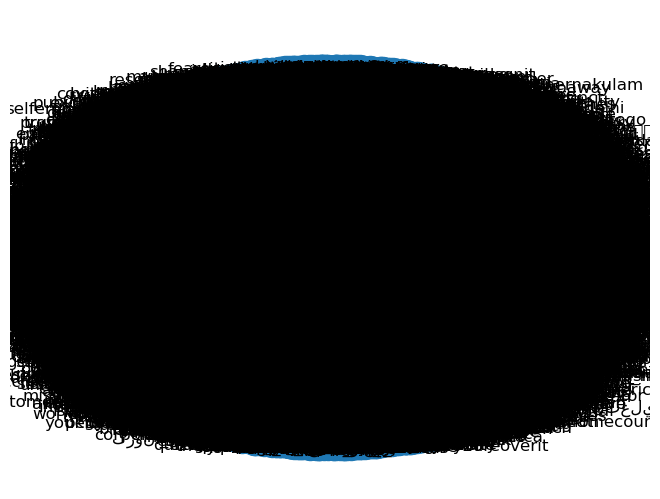

In [ ]:
import matplotlib.pyplot as plt
pos = nx.spring_layout(G)
weights = [G[u][v]['weight'] for u, v in G.edges()]
nx.draw(G, pos, width=weights)
plt.show()

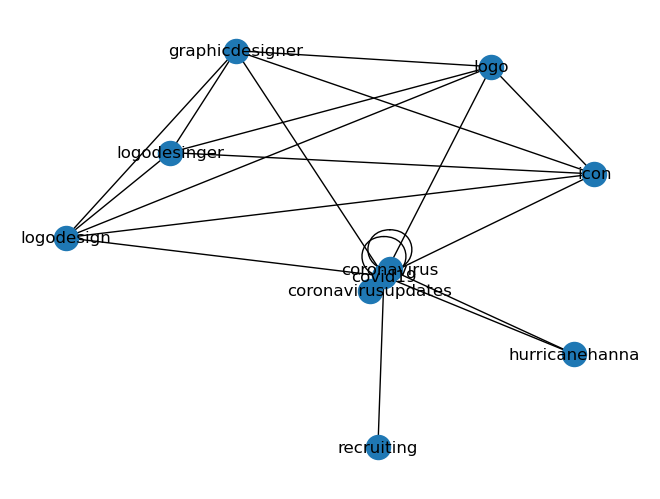

In [69]:
subset_nodes = list(G.nodes())[:10]

# Create the subgraph
subgraph = G.subgraph(subset_nodes)

# Draw the subgraph
pos = nx.spring_layout(subgraph)
weights = [subgraph[u][v]['weight'] for u, v in subgraph.edges()]
nx.draw(subgraph, pos,with_labels=True)
plt.show()

In [ ]:
#group and divide df into weeks based on the date column
df['date'] = pd.to_datetime(df['date'])
df['week'] = df['date'].dt.isocalendar().week
df['week'] = df['week'].astype(str)
df

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet,user_mentions,week
2,time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,0.000381,9525,7254,False,2020-07-25 12:27:14,@diane3443 @wdunlap @realDonaldTrump Trump nev...,[covid19],Twitter for Android,False,"[diane3443, wdunlap, realdonaldtrump]",30
3,ethel mertz,Stuck in the Middle,#Browns #Indians #ClevelandProud #[]_[] #Cavs ...,2019-03-07 01:45:06,0.000008,987,1488,False,2020-07-25 12:27:10,@brookbanktv The one gift #COVID19 has give me...,[covid19],Twitter for iPhone,False,[brookbanktv],30
4,diprjk,Jammu and Kashmir,🖊️Official Twitter handle of Department of Inf...,2017-02-12 06:45:15,0.004147,168,101,False,2020-07-25 12:27:08,25 July : Media Bulletin on Novel #CoronaVirus...,"[coronavirusupdates, covid19]",Twitter for Android,False,"[kansalrohit69, drsyedsehrish, airnewsalerts, ...",30
5,🎹 franz schubert,Новоро́ссия,🎼 #Новоро́ссия #Novorossiya #оставайсядома #S...,2018-03-19 16:29:52,0.000048,1071,1287,False,2020-07-25 12:27:06,#coronavirus #covid19 deaths continue to rise....,"[coronavirus, covid19]",Twitter Web App,False,[],30
6,hr bartender,"Gainesville, FL",Workplace tips and advice served up in a frien...,2008-08-12 18:19:49,0.003282,54810,3801,False,2020-07-25 12:27:03,How #COVID19 Will Change Work in General (and ...,"[covid19, recruiting]",Buffer,False,[proactivetalent],30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
179101,new jersey herald,"Newton, NJ","The New Jersey Herald, a daily newspaper in Ne...",2010-01-07 18:19:37,0.000258,162,38,False,2020-08-29 19:44:27,Wallkill school nurse adds COVID-19 monitoring...,"[nurses, covid19, coronavirus, schools]",SocialNewsDesk,False,[],35
179102,pris,T.O.,"A/V/L Techie, camera op. but twitter has becom...",2008-12-31 16:16:12,0.000010,160,627,False,2020-08-29 19:44:23,"we have reached 25mil cases of #covid19, world...",[covid19],Twitter Web App,False,[],35
179103,ajimati abdulrahman o,"Ilorin, Nigeria",Animal Scientist|| Muslim|| Real Madrid/Chelsea,2013-12-30 18:59:19,0.000017,1609,1062,False,2020-08-29 19:44:21,Thanks @IamOhmai for nominating me for the @WH...,[wearamask],Twitter for Android,False,"[iamohmai, who, abdlbaasit, hvbxxb…]",35
179104,jason,Ontario,When your cat has more baking soda than Ninja ...,2011-12-21 04:41:30,0.000006,182,7295,False,2020-08-29 19:44:16,2020! The year of insanity! Lol! #COVID19 http...,[covid19],Twitter for Android,False,[],35


In [73]:
#group by week
df_week_1 = df[df['week'] == '30']
df_week_2 = df[df['week'] == '31']
df_week_3 = df[df['week'] == '32']
df_week_4 = df[df['week'] == '33']
df_week_5 = df[df['week'] == '34']
df_week_6 = df[df['week'] == '35']

In [75]:
def create_graph(df):
    G = nx.Graph()

# Iterate through each row in the DataFrame
    for _, row in df.iterrows():
        hashtags = row['hashtags']
        #hashtags = hashtags[1:-1].split(", ")
        #hashtags = "".join(hashtags)
        #hastags = hashtags.lower()
        follower_count = row['user_followers']
        if len(hashtags) <= 1:
            continue
        # Add edges for each pair of hashtags
        for hashtag1, hashtag2 in combinations(hashtags, 2):
            if G.has_edge(hashtag1, hashtag2):
                G[hashtag1][hashtag2]['weight'] += follower_count
            else:
                G.add_edge(hashtag1, hashtag2, weight=follower_count)

    return G

In [76]:
G_week_1 = create_graph(df_week_1)
G_week_2 = create_graph(df_week_2)
G_week_3 = create_graph(df_week_3)
G_week_4 = create_graph(df_week_4)
G_week_5 = create_graph(df_week_5)
G_week_6 = create_graph(df_week_6)




In [78]:

print(G_week_6)

Graph with 3547 nodes and 9378 edges


In [79]:
def draw_graph(G):
    pos = nx.spring_layout(G)
    plt.figure(figsize=(50, 50)) 
    weights = [G[u][v]['weight'] for u, v in G.edges()]
    nx.draw(G, pos, width=weights)
    plt.show()

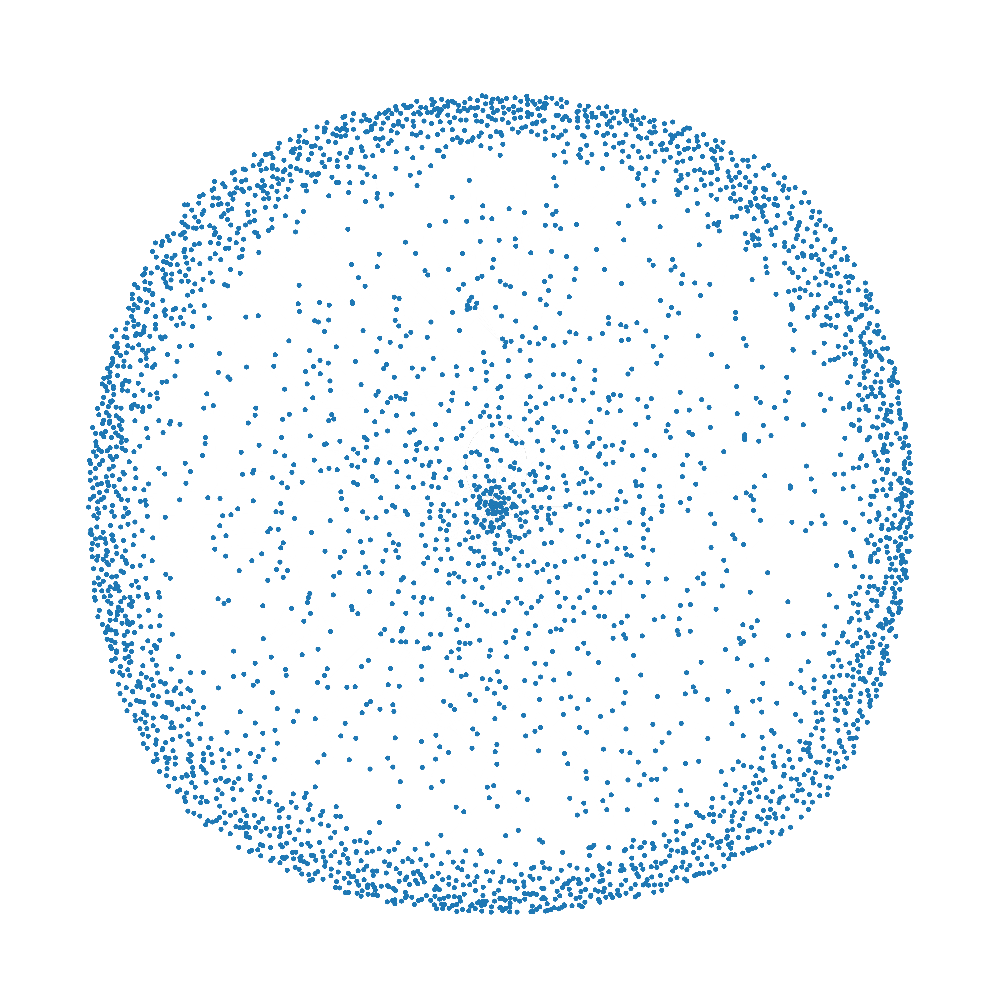

In [80]:
draw_graph(G_week_6)

In [81]:
#save graph to file
nx.write_gexf(G_week_1, "graphs\week_1.gexf")
nx.write_gexf(G_week_2, "graphs\week_2.gexf")
nx.write_gexf(G_week_3, "graphs\week_3.gexf")
nx.write_gexf(G_week_4, "graphs\week_4.gexf")
nx.write_gexf(G_week_5, "graphs\week_5.gexf")
nx.write_gexf(G_week_6, "graphs\week_6.gexf")